In [0]:
from keras.preprocessing.image import load_img, img_to_array
import numpy as np
from scipy.misc import imsave
from scipy.optimize import fmin_l_bfgs_b
import time

from keras.applications import vgg16
from keras import backend as K
from keras.layers import Input
from matplotlib import pyplot as plt
%matplotlib inline

Using TensorFlow backend.


In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
img_width, img_height = 224, 224

image_path = '/content/gdrive/image.jpeg'  #path of the image file
output_name = '/content/gdrive/results/im'# path where results are to be saved

In [0]:
img_size = (img_height, img_width, 3)

inp_img = Input(batch_shape=(1,) + img_size)

In [0]:
model = vgg16.VGG16(input_tensor=inp_img,
                    weights='imagenet', include_top=True)  # Loading the already trained VGG16 model

Instructions for updating:
Colocations handled automatically by placer.


In [0]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (1, 224, 224, 3)          0         
_________________________________________________________________
block1_conv1 (Conv2D)        (1, 224, 224, 64)         1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (1, 224, 224, 64)         36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (1, 112, 112, 64)         0         
_________________________________________________________________
block2_conv1 (Conv2D)        (1, 112, 112, 128)        73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (1, 112, 112, 128)        147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (1, 56, 56, 128)          0         
__________

In [0]:
#processing the image for input to keras model

def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_height, img_width))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg16.preprocess_input(img)
    return img

def deprocess_image(x):
    x = x.reshape((img_height, img_width, 3))
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [0]:
layer_dict = dict([(layer.name, layer) for layer in model.layers])

for key in layer_dict:
    print (key, layer_dict[key])

input_1 <keras.engine.input_layer.InputLayer object at 0x7fc5a7ad57b8>
block1_conv1 <keras.layers.convolutional.Conv2D object at 0x7fc5a7ad5898>
block1_conv2 <keras.layers.convolutional.Conv2D object at 0x7fc5907d18d0>
block1_pool <keras.layers.pooling.MaxPooling2D object at 0x7fc59077f390>
block2_conv1 <keras.layers.convolutional.Conv2D object at 0x7fc59077fef0>
block2_conv2 <keras.layers.convolutional.Conv2D object at 0x7fc58ff36dd8>
block2_pool <keras.layers.pooling.MaxPooling2D object at 0x7fc58fee16d8>
block3_conv1 <keras.layers.convolutional.Conv2D object at 0x7fc58fee1048>
block3_conv2 <keras.layers.convolutional.Conv2D object at 0x7fc58ff0f390>
block3_conv3 <keras.layers.convolutional.Conv2D object at 0x7fc58fea59b0>
block3_pool <keras.layers.pooling.MaxPooling2D object at 0x7fc58febefd0>
block4_conv1 <keras.layers.convolutional.Conv2D object at 0x7fc58febe9e8>
block4_conv2 <keras.layers.convolutional.Conv2D object at 0x7fc58fe6ac18>
block4_conv3 <keras.layers.convolutional.Con

In [0]:
layer_out = layer_dict['block4_conv2'].output
layer_out1 = layer_dict['block5_conv2'].output

#combining the output from two kernels and take them as a loss value
print (layer_out.shape)
loss = -1.0*K.mean(layer_out[:, :, :, 5])
loss -= 0.3*K.mean(layer_out1[:, :, :, 10])

(1, 28, 28, 512)


In [0]:
grads = K.gradients(loss, inp_img)  #gradients of loss wrt the input image


outputs = [loss]
if isinstance(grads, (list, tuple)):
    outputs += grads
else:
    outputs.append(grads)

f_outputs = K.function([inp_img], outputs)   #Encpsulating the input and output where output is the gradient and loss value

In [0]:
#a function which takes an array of image and find its loss and gradient with respect to the outpu from kernel
def loss_and_grads(x):
    x = x.reshape((1,)+ img_size)
    outs = f_outputs([x])
    loss_value = outs[0]
    if len(outs[1:]) == 1:
        grad_values = outs[1].flatten().astype('float64')
    else:
        grad_values = np.array(outs[1:]).flatten().astype('float64')
    return loss_value, grad_values

#encapulation of everything
class Evaluator:
    def __init__(self):
        self.loss_value = None
        self.grad_values = None

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

evaluator = Evaluator()

In [0]:
# Random noise added to the input image so that it can get some distortions easily.

settings = {
    'jitter': 0.05,
}


all_loss = []

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.
/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


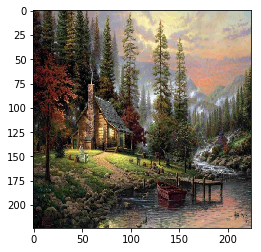

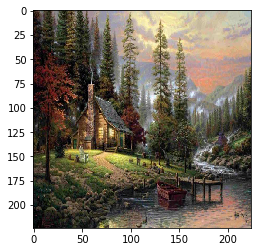

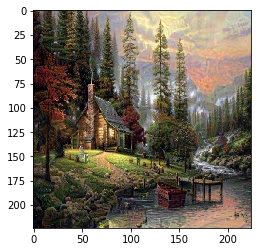

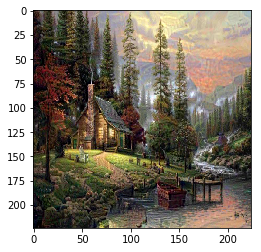

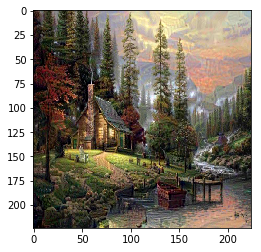

...

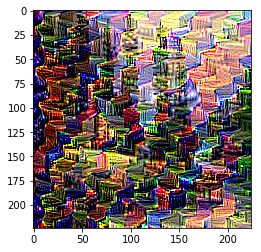

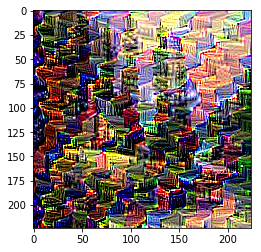

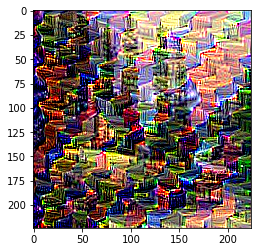

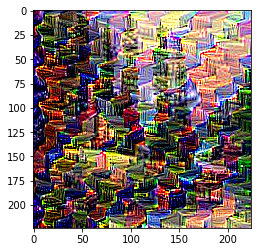

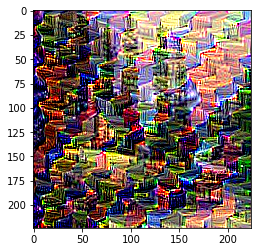

In [0]:
x = preprocess_image('/content/gdrive/My Drive/image.jpeg')

for i in range(100):
    start_time = time.time()

    random_jitter = (settings['jitter'] * 2) * (np.random.random(img_size) - 0.5)
    x += random_jitter

    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                     fprime=evaluator.grads, maxfun=5)

    all_loss.append(min_val)
    
    x = x.reshape(img_size)
    x -= random_jitter
    img = deprocess_image(np.copy(x))
    
    plt.figure(i)
    plt.imshow(img)
    
    fname = '/content/gdrive/My Drive/results/new_img' + '_at_iteration_%d.png' % i
    imsave(fname, img)
    end_time = time.time()
    
plt.show()